In [1]:
%cd /ihme/homes/yongqx2/vivarium_csu_ltbi/src/vivarium_csu_ltbi/verification_and_validation

/ihme/homes/yongqx2/vivarium_csu_ltbi/src/vivarium_csu_ltbi/verification_and_validation


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
from gbd_mapping import causes
from db_queries import get_outputs, get_ids
from matplotlib.backends.backend_pdf import PdfPages

from ltbi_sim_outputs_processing import *
pd.set_option('display.max_rows', 8)
warnings.filterwarnings('ignore')



!date
!whoami

Mon Nov 18 22:51:33 PST 2019
yongqx2


In [3]:
gbd_names = ['drug_susceptible_tuberculosis',
             'multidrug_resistant_tuberculosis_without_extensive_drug_resistance',
             'extensively_drug_resistant_tuberculosis',
             'hiv_aids_drug_susceptible_tuberculosis',
             'hiv_aids_multidrug_resistant_tuberculosis_without_extensive_drug_resistance',
             'hiv_aids_extensively_drug_resistant_tuberculosis',
             'hiv_aids_resulting_in_other_diseases']

In [4]:
age_group_ids = list(range(2, 21)) + [30, 31, 32, 235]

age_table = get_ids('age_group')
age_table = age_table[age_table.age_group_id.isin(age_group_ids)]
age_table['age_group_name'] = age_table.age_group_name.str.replace(' ', '_').map(lambda x: x.lower())

age_dict = dict(zip(age_table.age_group_name, age_table.age_group_id))

In [5]:
# prepare sim results for South Africa
df = load_data(path_for_location['South Africa'])
output = get_disaggregated_results(df, cause_names)
pt = get_person_time(df)
output_w_pt = pd.merge(output, pt, on=['sex', 'age_group', 'input_draw'])

In [6]:
output_w_pt

,cause,sex,age_group,measure,input_draw,value,person_time
0,activetb_positive_hiv,Female,10_to_14,dalys,3.0,4.243167,132792.880695
1,activetb_positive_hiv,Female,10_to_14,death,3.0,0.000000,132792.880695
2,activetb_positive_hiv,Female,10_to_14,ylds,3.0,4.243167,132792.880695
3,activetb_positive_hiv,Female,10_to_14,ylls,3.0,0.000000,132792.880695
...,...,...,...,...,...,...,...
136892,susceptible_tb_positive_hiv,Male,post_neonatal,dalys,973.0,175.527082,2526.067451
136893,susceptible_tb_positive_hiv,Male,post_neonatal,death,973.0,2.000000,2526.067451
136894,susceptible_tb_positive_hiv,Male,post_neonatal,ylds,973.0,0.888763,2526.067451
136895,susceptible_tb_positive_hiv,Male,post_neonatal,ylls,973.0,174.638319,2526.067451


In [7]:
def get_gbd_results(location_id: int, cause_names: list):
    ages = age_group_ids
    male, female, both = 1, 2, 3
    rate = 3
    deaths, dalys, ylds, ylls = 1, 2, 3, 4
    
    cause_map = {c.gbd_id: c.name for c in causes if c.name in cause_names}

    gbd_outputs = get_outputs('cause', cause_id=list(cause_map.keys()), 
                              metric_id=[rate], measure_id=[deaths, dalys, ylls, ylds], 
                              sex_id = [male, female, both], age_group_id=ages,
                              location_id=location_id, gbd_round_id=5)


    gbd_outputs = gbd_outputs[['cause_id', 'age_group_name', 'measure_name', 'sex', 'val', 'upper', 'lower']]
    gbd_outputs['cause'] = gbd_outputs.cause_id.map(cause_map)
    gbd_outputs['measure'] = gbd_outputs.measure_name.map({'Deaths': 'death',
                                                           'DALYs (Disability-Adjusted Life Years)':'dalys',
                                                           'YLLs (Years of Life Lost)': 'ylls',
                                                           'YLDs (Years Lived with Disability)': 'ylds'})
    gbd_outputs['age_group'] = gbd_outputs.age_group_name.str.replace(' ', '_').map(lambda x: x.lower())
    gbd_outputs = gbd_outputs.drop(columns=['cause_id', 'measure_name', 'age_group_name'])
    gbd_outputs[['val', 'upper', 'lower']] *= 100_000
    gbd_outputs = gbd_outputs.fillna(0.0)
    
    gbd_outputs = gbd_outputs.set_index(['cause', 'sex', 'measure']).sort_index().reset_index()
    
    return gbd_outputs

In [8]:
def aggregate_gbd_results(df: pd.DataFrame, cause_names: list):
    idx_cols = ['sex', 'age_group', 'measure']
    val_cols = ['val', 'upper', 'lower']
    sex = df.sex.unique()
    age_group = df.age_group.unique()
    measure = df.measure.unique()
    data = pd.DataFrame(0.0,
                        index=pd.MultiIndex.from_product([sex, age_group, measure], names=idx_cols),
                        columns=val_cols)
    for cause in cause_names:
        data += df.loc[df.cause == cause].drop(columns='cause').set_index(idx_cols)
    return data.reset_index()

In [9]:
def filter_gbd_results(df: pd.DataFrame, cause_names: list):
    activetb_susceptible_hiv = aggregate_gbd_results(df, cause_names[:3])
    activetb_susceptible_hiv['cause'] = 'activetb_susceptible_hiv'
    
    activetb_positive_hiv = aggregate_gbd_results(df, cause_names[3:-1])
    activetb_positive_hiv['cause'] = 'activetb_positive_hiv'
    
    susceptible_tb_positive_hiv = df.loc[df.cause == cause_names[-1]]
    susceptible_tb_positive_hiv['cause'] = 'susceptible_tb_positive_hiv'
    
    data = pd.concat([activetb_susceptible_hiv, activetb_positive_hiv, susceptible_tb_positive_hiv],
                     ignore_index=True, sort=True)
    data = data.set_index(template_cols[:-1]).reset_index()
    return data

In [10]:
# prepare gbd results for South Africa
rsa_gbd = get_gbd_results(196, gbd_names)
gbd = filter_gbd_results(rsa_gbd, gbd_names)
gbd

,cause,sex,age_group,measure,lower,upper,val
0,activetb_susceptible_hiv,Both,early_neonatal,dalys,0.077568,0.174952,0.121306
1,activetb_susceptible_hiv,Both,early_neonatal,death,0.000000,0.000000,0.000000
2,activetb_susceptible_hiv,Both,early_neonatal,ylds,0.077568,0.174952,0.121306
3,activetb_susceptible_hiv,Both,early_neonatal,ylls,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
824,susceptible_tb_positive_hiv,Male,80_to_84,ylls,204.065729,452.278942,309.054762
825,susceptible_tb_positive_hiv,Male,85_to_89,ylls,111.586143,273.058634,178.074482
826,susceptible_tb_positive_hiv,Male,90_to_94,ylls,110.426683,250.132721,168.628272
827,susceptible_tb_positive_hiv,Male,95_plus,ylls,49.505296,115.287317,76.281457


In [11]:
def make_plots(cause: str, sim_results: pd.DataFrame, gbd_results: pd.DataFrame, location: str, measure: str):
    
    sim_results = sim_results.loc[sim_results.age_group.map(age_dict).sort_values().index]
    sim_results = sim_results.set_index(['cause', 'sex', 'measure']).sort_index().reset_index()
    sim_data = sim_results.loc[sim_results.cause == cause]
    sim_data['rate'] = sim_data['value'] / sim_data['person_time'] * 100_000
    
    sim_mean = sim_data.groupby(template_cols[:-1]).rate.mean().reset_index()
    sim_mean = sim_mean.loc[sim_mean.age_group.map(age_dict).sort_values().index]
    sim_mean = sim_mean.set_index(['cause', 'sex', 'measure']).sort_index().reset_index()
    
    gbd_data = gbd_results.loc[(gbd_results.sex != 'Both') & (gbd_results.cause == cause)]
    
    measure_s = sim_data.loc[sim_data.measure == measure]
    measure_m = sim_mean.loc[sim_mean.measure == measure]
    measure_g = gbd_data.loc[gbd_data.measure == measure]
    
    fig, ax = plt.subplots(figsize=(20, 10))
    clrs = sns.color_palette('husl', 2)

    g1 = sns.catplot(x='age_group', y='rate', 
                     hue='sex', palette=clrs, alpha=0.2, 
                     ax=ax, data=measure_s)
    sns.scatterplot(x='age_group', y='rate', 
                    hue='sex', palette=clrs, 
                    s=300, marker='P', 
                    ax=ax, legend=False, data=measure_m)
    sns.lineplot(x='age_group', y='val', 
                 hue='sex', palette=clrs, linewidth=2,
                 ax=ax, data=measure_g, sort=False)

    for i, sex in enumerate(['Female', 'Male']):
        sex_g = measure_g.loc[measure_g.sex == sex]
        ax.fill_between(sex_g.age_group, sex_g.upper, sex_g.lower, alpha=0.3, facecolor=clrs[i])

    ax.set_title(f'{location}, {measure.capitalize()} due to {cause}', fontsize=20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=60, fontsize=16)
    ax.set_xlabel('Age group', fontsize=18)
    ax.set_ylabel(f'{measure.capitalize()} per 100k PY', fontsize=18)

    l = ax.legend(loc='best')
    labels = ['GBD Female', 'GBD Male', 'Sim Female', 'Sim Male']
    for text, label in zip(l.texts[1:], labels):
        text.set_text(label)

    plt.close(g1.fig)

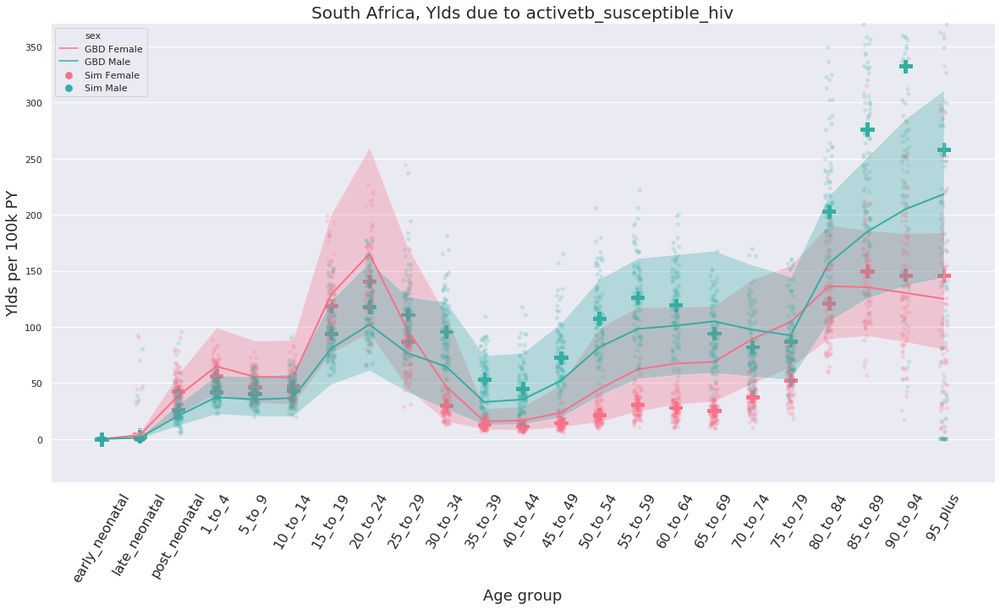

In [12]:
make_plots('activetb_susceptible_hiv', output_w_pt, gbd, 'South Africa', 'ylds')

In [13]:
def plot_multiple_locations(path_dict: dict, cause_names: list, gbd_names: list):
    
    location_table = get_ids('location')
    
    for location, path in path_dict.items():    
        df = load_data(path)
        pt = get_person_time(df)
        output = get_disaggregated_results(df, cause_names)
        output_w_pt = pd.merge(output, pt, on=['sex', 'age_group', 'input_draw'])
        
        location_id = location_table.loc[location_table.location_name == location].location_id.values
        gbd = get_gbd_results(location_id, gbd_names)
        gbd_new = filter_gbd_results(gbd, gbd_names)
        
        with PdfPages(f'/home/j/Project/simulation_science/latent_tuberculosis_infection/validation/ltbi_cause_model_vv_in_{location}.pdf') as pdf:
            for cause in ['activetb_susceptible_hiv', 'activetb_positive_hiv', 'susceptible_tb_positive_hiv']:
                for measure in ['death', 'dalys', 'ylds', 'ylls']:
                    make_plots(cause, output_w_pt, gbd_new, location, measure)
                    pdf.savefig(bbox_inches='tight')

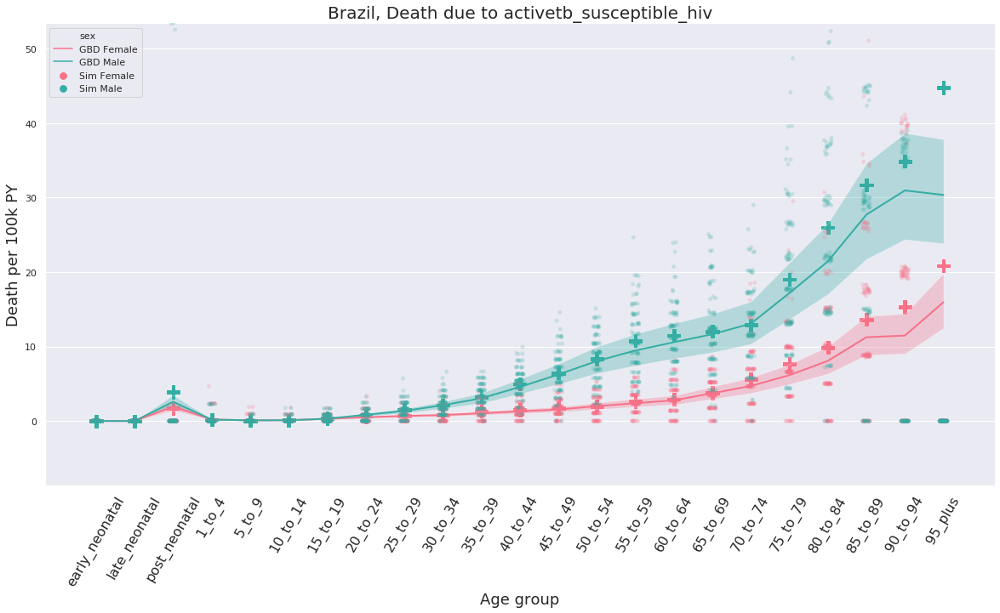

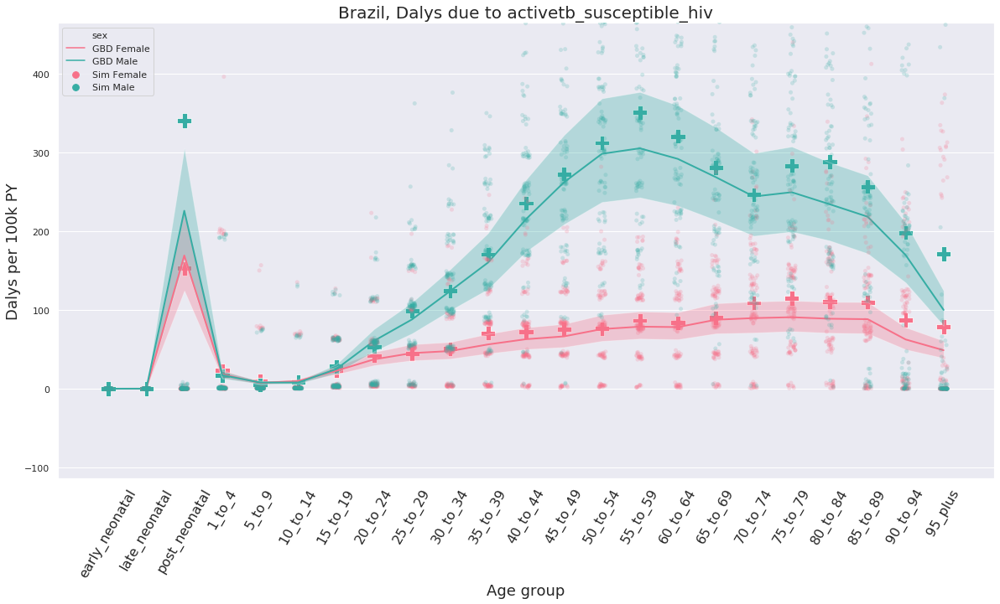

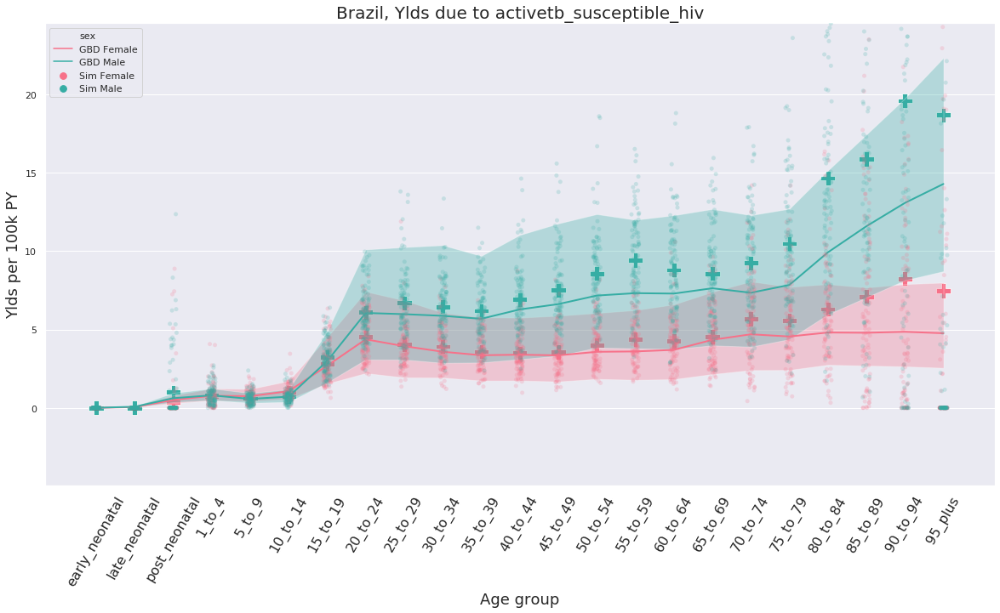

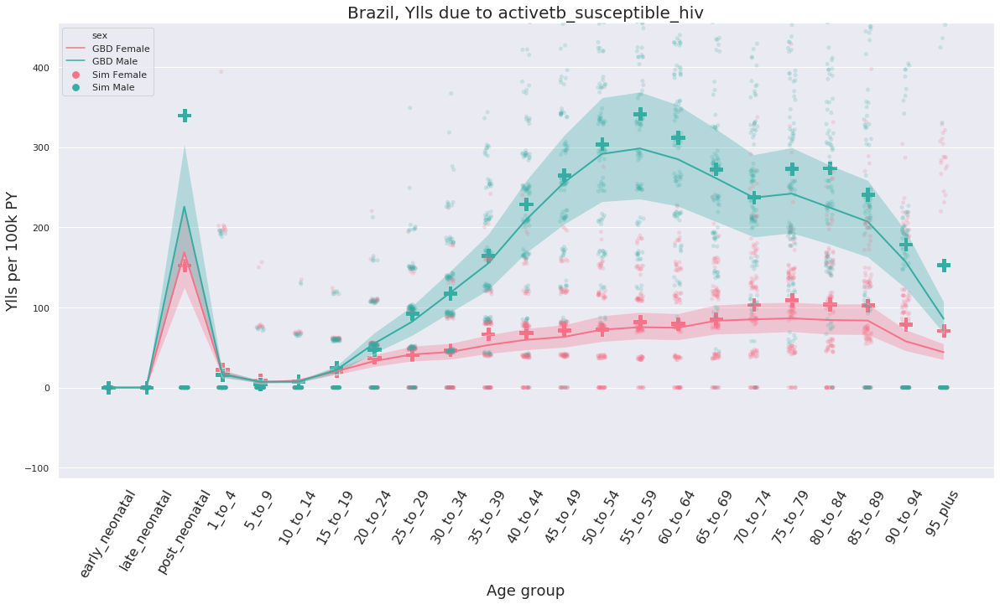

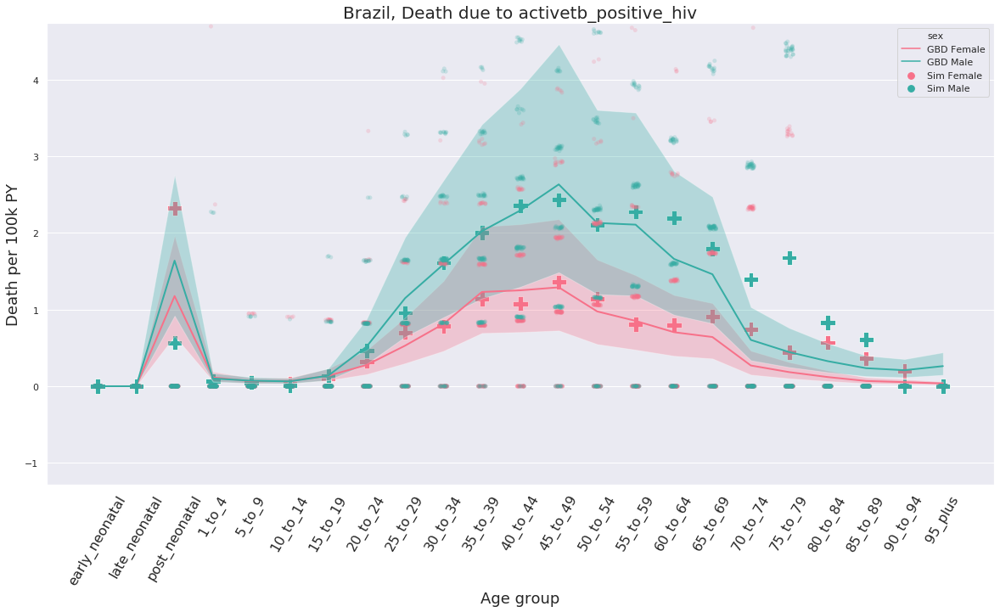

...

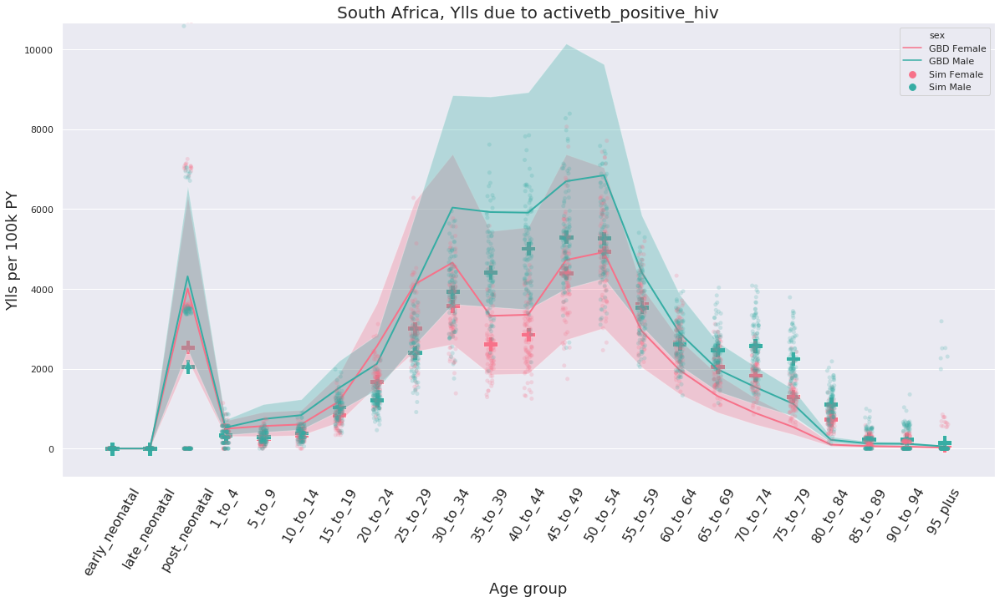

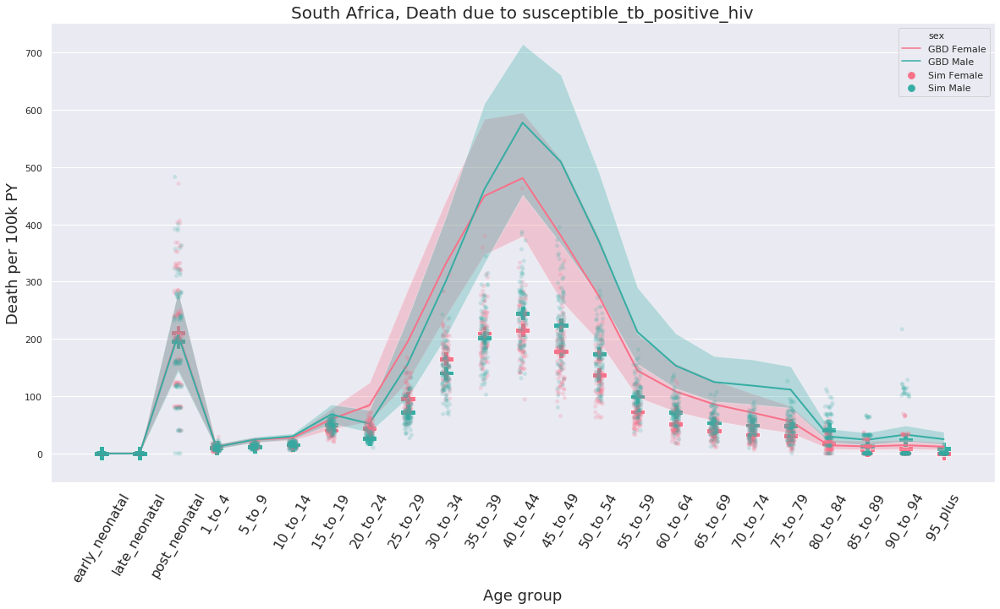

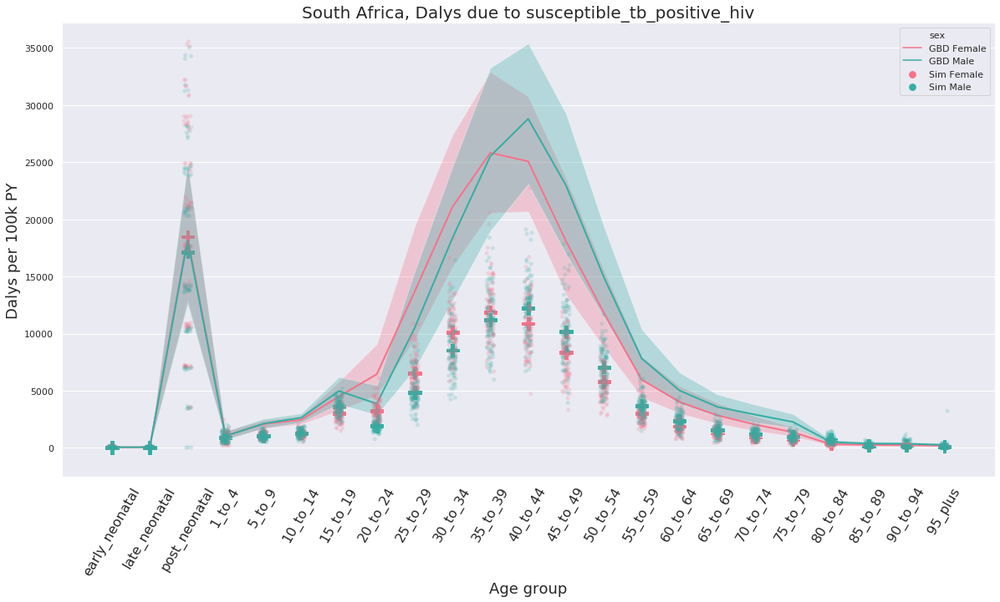

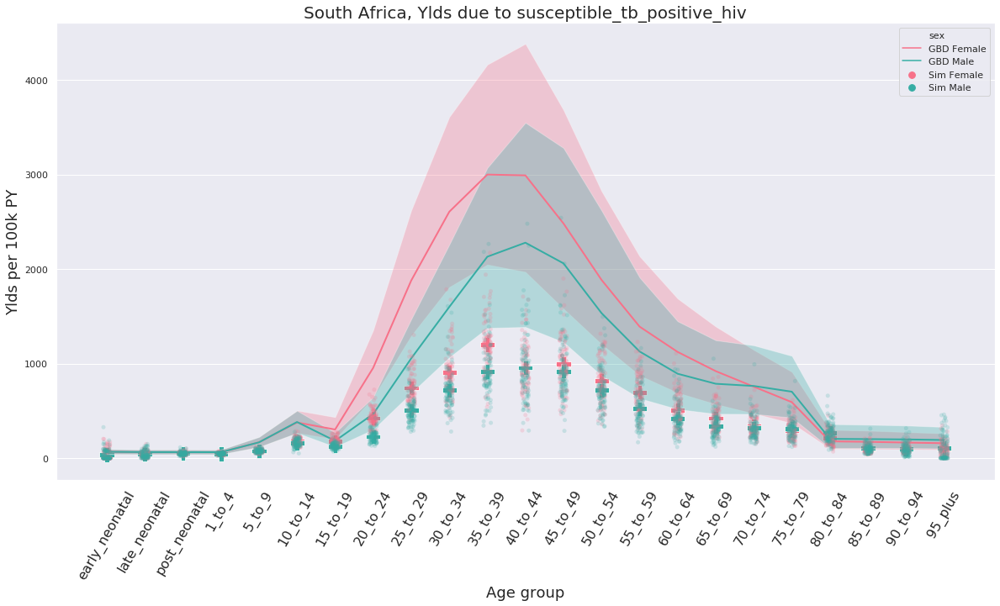

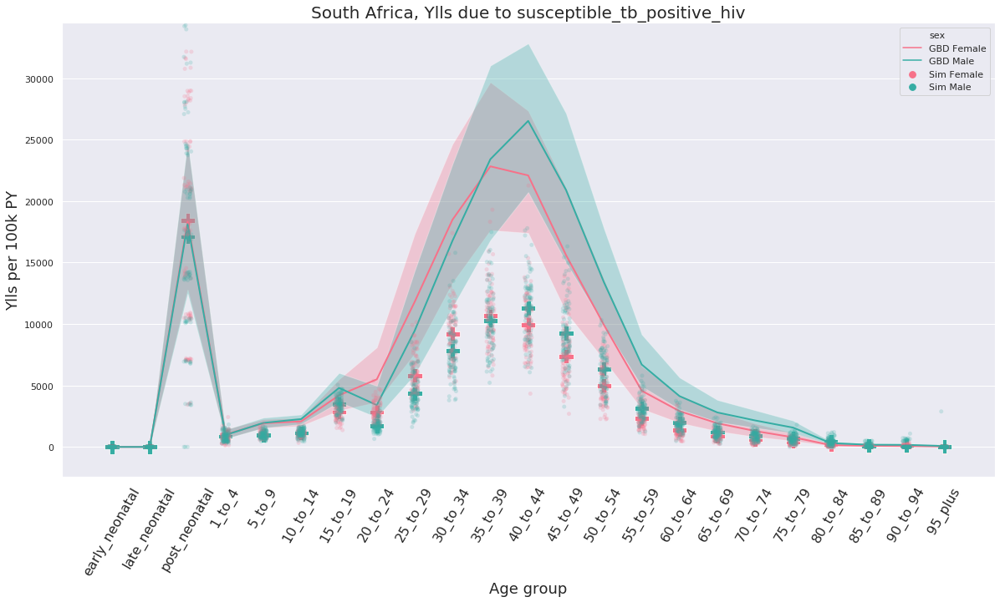

In [14]:
plot_multiple_locations(path_for_location, cause_names, gbd_names)